## Кластеризация по евклидовой метрике

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from tslearn.metrics import dtw, soft_dtw
from sklearn.decomposition import PCA
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
import statsmodels.api as sm
from tqdm import tqdm
from IPython.core.display import display, HTML
from tqdm import tnrange
from sklearn.manifold import TSNE
from pandas.plotting import register_matplotlib_converters
from sklearn.model_selection import cross_val_score
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from scipy.signal import argrelmax
register_matplotlib_converters()

In [3]:
from labellines import labelLine, labelLines

In [4]:
sns.set()

In [5]:
df = pd.read_csv('st_ts.txt', index_col='id')

In [6]:
df.columns =  pd.to_datetime(df.columns)

In [8]:
# df = df[:60000]

In [9]:
df.shape

(323766, 105)

In [10]:
df.head()

,2017-08-28,2017-09-04,2017-09-11,2017-09-18,2017-09-25,2017-10-02,2017-10-09,2017-10-16,2017-10-23,2017-10-30,...,2019-06-24,2019-07-01,2019-07-08,2019-07-15,2019-07-22,2019-07-29,2019-08-05,2019-08-12,2019-08-19,2019-08-26
id,,,,,,,,,,,,,,,,,,,,,
0,3,0,2,2,6,1,1,0,3,0,...,6,4,5,1,0,1,0,0,0,0
1,0,0,0,0,2,1,2,1,1,0,...,1,1,0,0,0,0,1,0,1,0
2,0,0,0,0,2,1,1,0,1,0,...,0,0,0,0,0,1,0,0,0,0
3,0,1,1,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,2,0,0,1,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1


Функция вычисления центроидов всех кластеров   
Расстояние между цетроидами кластеров (на вход матрица цетроидов)   
Функция вычисления среднего расстояния между кластерами

In [11]:
def centroids(data, clusters):
    n = np.unique(clusters)
    dist_mean = []
    dist_median = []
    for i in n:
        matrix = data[clusters == i]
        dist_mean.append(np.mean(matrix, axis=0))
        dist_median.append(np.median(matrix, axis=0))
    return np.array(dist_mean), np.array(dist_median)


def cluster_dist(matrix):
    size = matrix.shape[0]
    av_dist = [sum((euclid(matrix[i], matrix[j]) for j in range(i, size))) for i in range(size)]
    return sum(av_dist)/ len(av_dist)


av_dist = lambda df, cl: cluster_dist(centroids(df, cl))

euclid = lambda x, y: np.sqrt(np.sum((x - y)**2))

Построение графиков

In [17]:
colors = ['b', 'g', 'r', 'm', 'c']   


def plot(*args):
    plt.figure(figsize=(20, 10), dpi=200)
    for arg in args:
        plt.plot(arg.T, c='black', alpha=0.4)
#     plt.title('Исходные данные')
    plt.savefig('ishod.png', bbox_inches = 'tight')

s1 = [pd.datetime(2017, 9, 1), pd.datetime(2018, 9, 1)]
d31 = [pd.datetime(2017, 12, 31), pd.datetime(2018, 12, 31)]
f14 = [pd.datetime(2018, 2, 14), pd.datetime(2019, 2, 14)]
f23 = [pd.datetime(2018, 2, 23), pd.datetime(2019, 2, 23)]
m8 = [pd.datetime(2018, 3, 8), pd.datetime(2019, 3, 8)]
allhol = [s1, d31, f14, f23, m8]
    
def plot_clust(data, clusters, lines=100):
    centroid, med_centroid = centroids(data, clusters)
    n = np.unique(clusters)
    fig = plt.figure(figsize=(20, 400))
    for i in n:
        plt.subplot(len(n), 1, i+1)
        plt.title(f'cluster {i}, {clusters[clusters==i].count()} items')
        for j, color in zip(allhol, colors):
            line1 = plt.axvline(j[0], c=color, label=str(j[0]))
            th1 = plt.text(j[0],
                           0.8,
                           f'{j[0].date()}',
                           verticalalignment='center',
                           rotation=90,
                           rotation_mode='anchor',
                           horizontalalignment='center',
                           fontsize=14,
                          va="baseline")

            line2 = plt.axvline(j[1], c=color, label=str(j[1]))
            th2 = plt.text(j[1],
                       0.8,
                       f'{j[1].date()}',
                       verticalalignment='center',
                       rotation=90,
                       rotation_mode='anchor',
                       horizontalalignment='center',
                       fontsize=14,
                      va="baseline")
#             plt.xticks(rotation=-45)
        idx = np.where(clusters == i)[0][:lines]
        l1 = plt.plot(data.columns, centroid[i], c='red', alpha=2, label='mean')
        l2 = plt.plot(data.columns, med_centroid[i], c='blue', alpha=2, label='median')
#         plt.legend([l1, l2], ['mean', 'median'], loc='upper right')
        for j in idx:
            plt.plot(data.T.iloc[:, j], c='black', alpha=0.05) 

In [13]:
def metrics_values(data, clusters):
    metrics = {'Average Distance': av_dist(data, clusters),
                'Silhouette score': silhouette_score(data, clusters),
                'Calinski-Harabasz score': calinski_harabasz_score(data, clusters),
                'Davies bouldin score': davies_bouldin_score(data, clusters)}
    return metrics
    

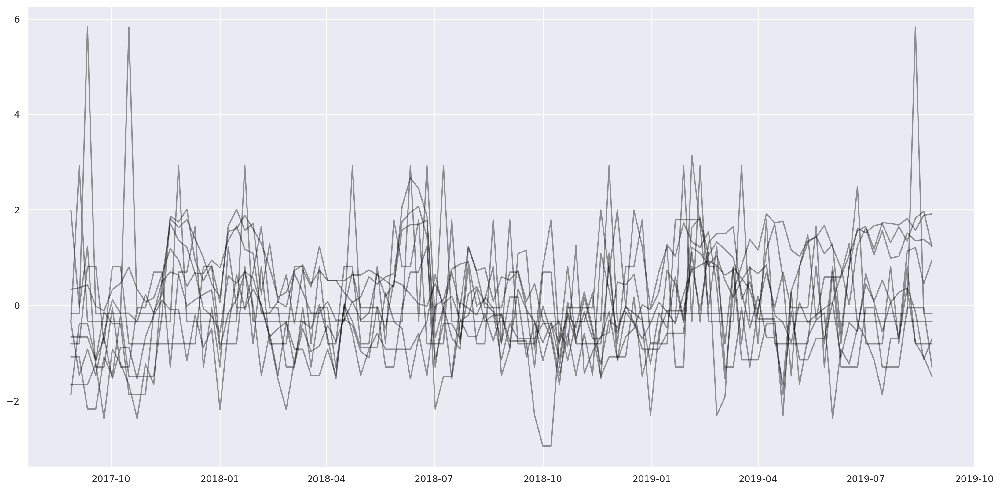

In [22]:
plot(sc_df[15:25])

In [19]:
scale = StandardScaler()
sc_df = pd.DataFrame(scale.fit_transform(np.log(1.1 + df).T).T, index=df.index, columns=df.columns)
sc_df.head()

,2017-08-28,2017-09-04,2017-09-11,2017-09-18,2017-09-25,2017-10-02,2017-10-09,2017-10-16,2017-10-23,2017-10-30,...,2019-06-24,2019-07-01,2019-07-08,2019-07-15,2019-07-22,2019-07-29,2019-08-05,2019-08-12,2019-08-19,2019-08-26
id,,,,,,,,,,,,,,,,,,,,,
0,0.837811,-1.467993,0.347821,0.347821,1.800155,-0.334740,-0.334740,-1.467993,0.837811,-1.467993,...,1.800155,1.220313,1.534106,-0.334740,-1.467993,-0.334740,-1.467993,-1.467993,-1.467993,-1.467993
1,-0.960348,-0.960348,-0.960348,-0.960348,1.317557,0.461298,1.317557,0.461298,0.461298,-0.960348,...,0.461298,0.461298,-0.960348,-0.960348,-0.960348,-0.960348,0.461298,-0.960348,0.461298,-0.960348
2,-0.731372,-0.731372,-0.731372,-0.731372,1.665273,0.764380,0.764380,-0.731372,0.764380,-0.731372,...,-0.731372,-0.731372,-0.731372,-0.731372,-0.731372,0.764380,-0.731372,-0.731372,-0.731372,-0.731372
3,-0.299183,2.144799,2.144799,-0.299183,-0.299183,-0.299183,3.616814,-0.299183,-0.299183,-0.299183,...,-0.299183,-0.299183,-0.299183,-0.299183,-0.299183,-0.299183,-0.299183,-0.299183,-0.299183,-0.299183
4,-0.387321,-0.387321,4.075234,-0.387321,-0.387321,2.397769,-0.387321,-0.387321,-0.387321,-0.387321,...,2.397769,2.397769,2.397769,2.397769,2.397769,2.397769,2.397769,2.397769,2.397769,2.397769


15    13029
1     12141
5     10790
44    10755
34    10460
0     10297
4     10105
28    10031
48     9513
8      8934
49     8337
26     8311
7      8273
37     8137
31     7708
23     7594
12     7392
13     7261
29     7060
6      7037
3      6792
39     6387
43     6381
42     6347
16     6326
22     6246
25     6216
30     6135
10     6069
33     5927
21     5660
9      5576
24     5551
36     5377
18     5273
14     4398
38     4168
41     4155
17     3735
40     3726
11     3674
27     3324
46     3277
19     3259
2      3018
20     2895
35     2773
32     2768
45     2713
47     2455
dtype: int64


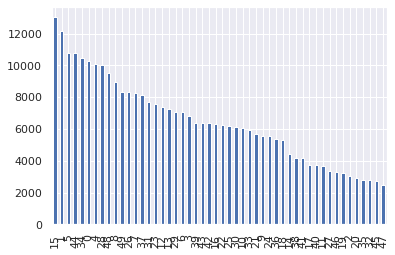

In [15]:
clusters = pd.Series(KMeans(max_iter=1000, n_clusters=50, n_jobs=-1).fit_predict(sc_df), index = sc_df.index)
print(clusters.value_counts())
pd.Series(clusters).value_counts().plot.bar()
plt.show()

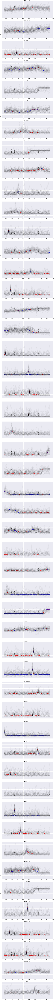

In [48]:
plot_clust(sc_df, clusters, 100)

In [ ]:
# for i in tnrange(2, 70):
#     pca = PCA(n_components=i, random_state=42)
#     red_df = pd.DataFrame(pca.fit_transform(sc_df))

#     clusters1 = KMeans(n_clusters=40, random_state=42).fit_predict(red_df)
#     print(i)
#     print(pd.Series(clusters1).value_counts())
#     print(av_dist(red_df, clusters1))

# pd.Series(clusters1).value_counts().plot.bar()
# plt.show()